In [1]:
import os
import cv2
from tensorflow.keras.models import load_model
import pandas as pd
from sklearn.metrics import classification_report
import seaborn as sns
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
from keras.models import load_model
import numpy as np
from tensorflow.keras.applications.resnet50 import preprocess_input as preprocess_resnet50
from tensorflow.keras.applications.inception_resnet_v2 import preprocess_input as preprocess_inception_resnet_v2
from tensorflow.keras.applications.inception_v3 import preprocess_input as preprocess_inception_v3
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input as preprocess_mobilenet_v2
from tensorflow.keras.applications.vgg16 import preprocess_input as preprocess_vgg16
from tensorflow.keras.applications.vgg19 import preprocess_input as preprocess_vgg19
from tensorflow.keras.applications.mobilenet_v3 import preprocess_input as preprocess_mobilenet_v3
from tensorflow.keras.applications.efficientnet import preprocess_input as preprocess_efficientnet

In [2]:
def get_preprocess_function(base_model_type):
    if base_model_type == 'ResNet50':
        return preprocess_resnet50
    elif base_model_type == 'InceptionResNetV2':
        return preprocess_inception_resnet_v2
    elif base_model_type == 'InceptionV3':
        return preprocess_inception_v3
    elif base_model_type == 'MobileNetV2':
        return preprocess_mobilenet_v2
    elif base_model_type == 'MobileNetV3':
        return preprocess_mobilenet_v3
    elif base_model_type == 'VGG16':
        return preprocess_vgg16
    elif base_model_type == 'VGG19':
        return preprocess_vgg19
    elif base_model_type == 'ResNet50V2':
        return preprocess_inception_resnet_v2
    elif base_model_type == 'EfficientNet':
        return preprocess_efficientnet
    else:
        raise ValueError(
            'Invalid base_model_type.')

In [3]:
def preprocess(file, input_shape):
    face = cv2.imread(file)
    face = cv2.cvtColor(face, cv2.COLOR_BGR2RGB)
    face = cv2.resize(face, input_shape)
    face = np.expand_dims(face, axis=0)
    return face

In [4]:
def visualize(model, input_shape,preprocess_input, model_name):

# Read the names from the text file into a list
    with open("names.txt", "r") as file:
        names = file.read().splitlines()

    true_labels = []
    predicted_labels = []

    dir_path = 'test'
    image_files = os.listdir(dir_path)

    num_columns = 5
    num_rows = len(image_files) // num_columns if len(image_files) % num_columns == 0 else len(image_files) // num_columns + 1

    fig, axs = plt.subplots(num_rows, num_columns, figsize=(15, num_rows * 3))

    true_labels = []
    predicted_labels = []

    correct_predictions = 0
    for i, ax in enumerate(axs.flatten()):
        if i < len(image_files):
            image_path = os.path.join(dir_path, image_files[i])
            
            face = preprocess(image_path, input_shape)
            if preprocess_input != None:
                face = preprocess_input(face)
            
            prediction = model.predict(face, verbose=0)
            
            index = np.argmax(prediction, axis=1)[0]
            prob = np.max(prediction, axis=1)[0]
            predicted_labels.append(str(index))  # convert number to string before appending

            # Extract the true label from the file name and compare with the predicted label
            true_label = image_files[i][0]
            true_label = str(image_files[i][0])  # ensure it's a string
            true_labels.append(true_label)

            if true_label == index:
                correct_predictions += 1

            predicted_name = names[int(index)]
            true_name = names[int(true_label)]

            original_image = cv2.imread(image_path)

            original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)

            ax.imshow(original_image)
            ax.set_title(f"True label: {true_name}")
            ax.text(0.5, -0.1, f"Predicted: {predicted_name}, Prob: {prob:.2f}", size=10, ha="center", transform=ax.transAxes)
            ax.axis('off')
        else:
            ax.axis('off')  

    plt.suptitle(model_name, size=20, y=1.02)
    plt.tight_layout()
    plt.show()

    cm = confusion_matrix(true_labels, predicted_labels)

    plt.figure(figsize=(10,10))
    sns.heatmap(cm, annot=True, fmt="d", linewidths=.5, square = True, cmap = 'Blues', xticklabels=names, yticklabels=names, annot_kws={"size": 16}) 
    plt.ylabel('Actual label', fontsize=15) 
    plt.xlabel('Predicted label', fontsize=15) 
    plt.title('Confusion Matrix', size = 20) 
    plt.xticks(fontsize=14)  
    plt.yticks(fontsize=14)
    plt.show()  

    return true_labels, predicted_labels, names

## RESNET50

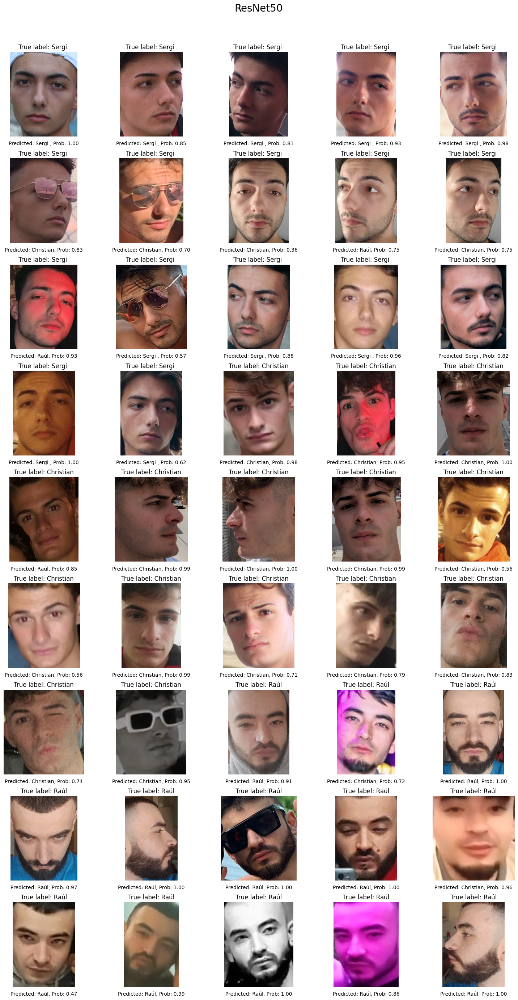

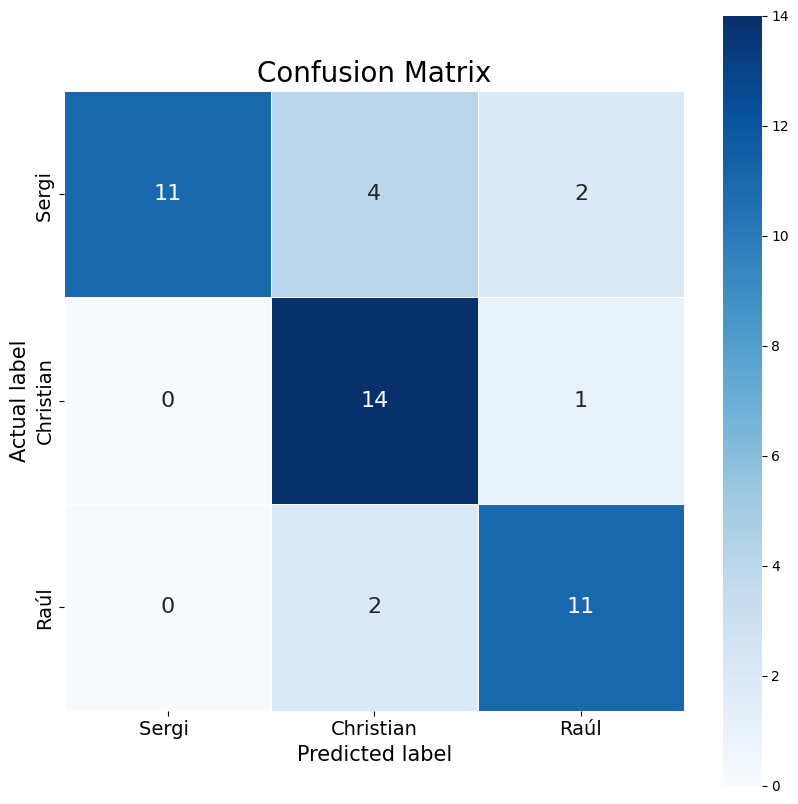

In [5]:
BASE_MODEL_TYPE = 'ResNet50'

model = load_model("cross_entropy_trained_models/" + "ResNet50.h5" )
preprocess_input = get_preprocess_function(BASE_MODEL_TYPE)
true_labels, predicted_labels, names = visualize(model, (224,224),preprocess_input, BASE_MODEL_TYPE)

In [7]:
report = classification_report(true_labels, predicted_labels, target_names=names, output_dict=True)
df = pd.DataFrame(report).transpose()

# Display as a styled table
df.style.set_table_styles(
    [{'selector': 'th',
    'props': [('background', '#606060'), 
                ('color', 'white'),
                ('font-family', 'verdana')]},
    {'selector': 'td',
    'props': [('font-family', 'verdana')]},
    ]
).set_precision(2)

df.style.background_gradient(cmap='viridis', subset=["precision", "recall", "f1-score"])

C:\Users\sergi\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:13: FutureWarning: this method is deprecated in favour of `Styler.format(precision=..)`
  del sys.path[0]


,precision,recall,f1-score,support
Sergi,1.000000,0.647059,0.785714,17.000000
Christian,0.700000,0.933333,0.800000,15.000000
Raúl,0.785714,0.846154,0.814815,13.000000
accuracy,0.800000,0.800000,0.800000,0.800000
macro avg,0.828571,0.808849,0.800176,45.000000
weighted avg,0.838095,0.800000,0.798883,45.000000


## VGG16

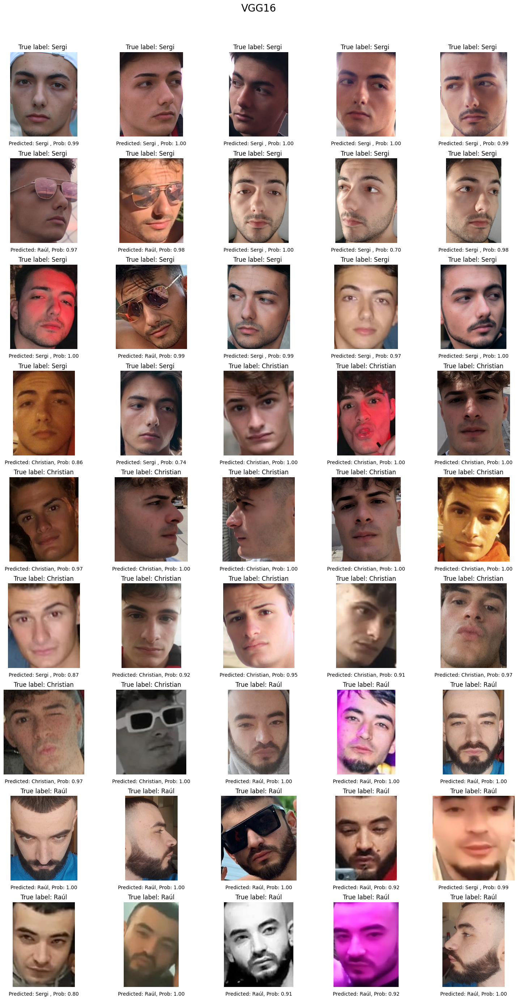

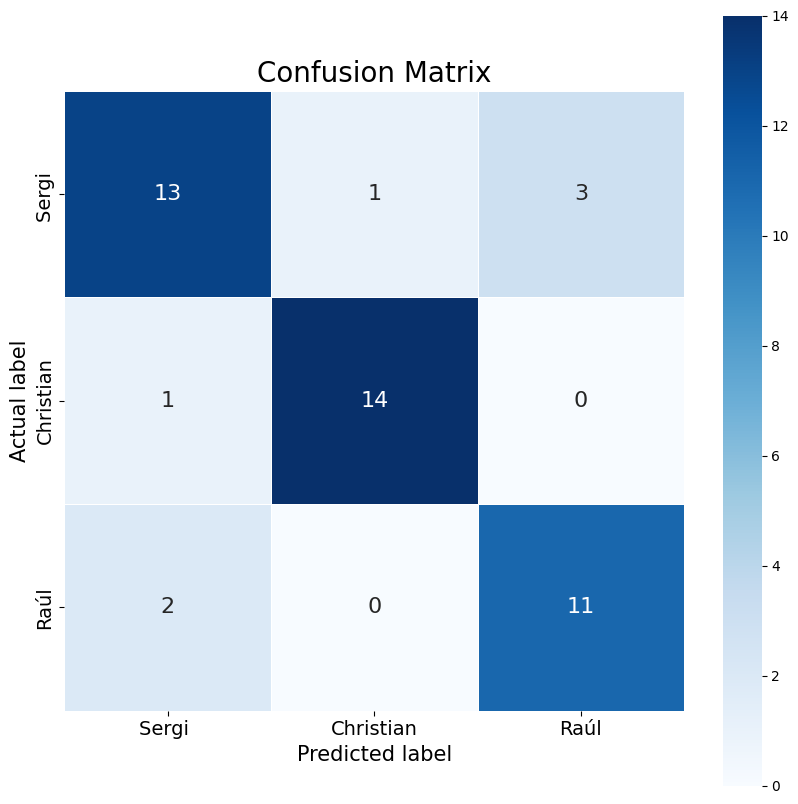

In [8]:
BASE_MODEL_TYPE = 'VGG16'

model = load_model("cross_entropy_trained_models/" + "VGG16.h5" )
preprocess_input = get_preprocess_function(BASE_MODEL_TYPE)
true_labels, predicted_labels, names = visualize(model, (224,224),preprocess_input, BASE_MODEL_TYPE)


In [10]:
report = classification_report(true_labels, predicted_labels, target_names=names, output_dict=True)
df = pd.DataFrame(report).transpose()

# Display as a styled table
df.style.set_table_styles(
    [{'selector': 'th',
    'props': [('background', '#606060'), 
                ('color', 'white'),
                ('font-family', 'verdana')]},
    {'selector': 'td',
    'props': [('font-family', 'verdana')]},
    ]
).set_precision(2)

df.style.background_gradient(cmap='viridis', subset=["precision", "recall", "f1-score"])

C:\Users\sergi\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:13: FutureWarning: this method is deprecated in favour of `Styler.format(precision=..)`
  del sys.path[0]


,precision,recall,f1-score,support
Sergi,0.812500,0.764706,0.787879,17.000000
Christian,0.933333,0.933333,0.933333,15.000000
Raúl,0.785714,0.846154,0.814815,13.000000
accuracy,0.844444,0.844444,0.844444,0.844444
macro avg,0.843849,0.848064,0.845342,45.000000
weighted avg,0.845040,0.844444,0.844145,45.000000


## InceptionV3

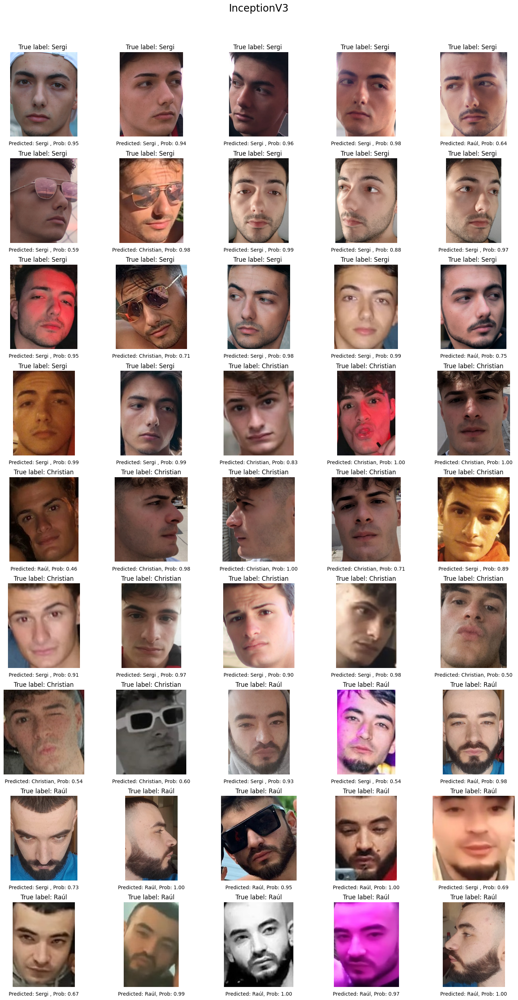

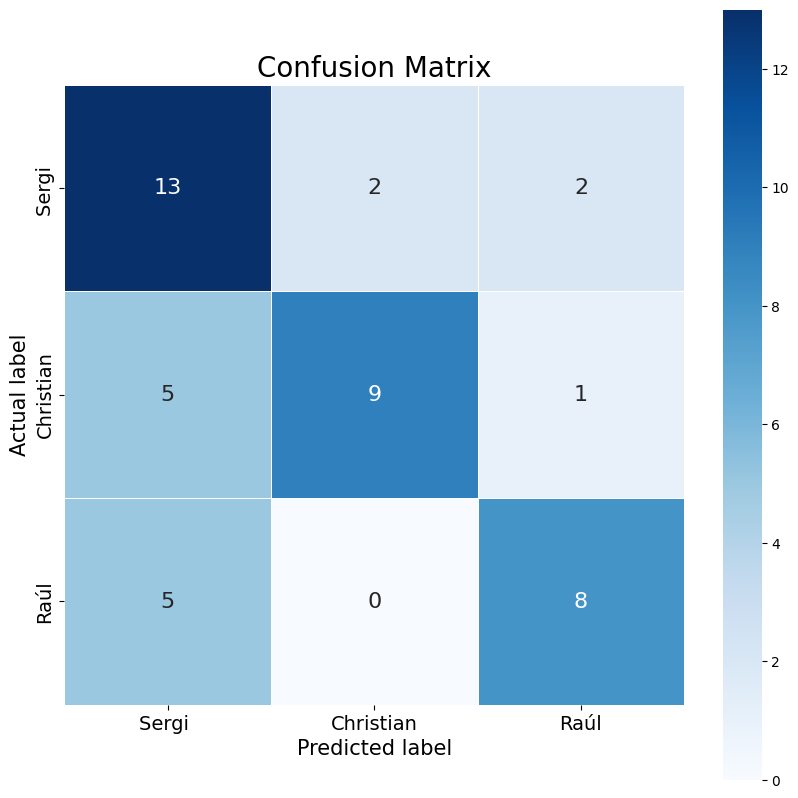

In [11]:
BASE_MODEL_TYPE = 'InceptionV3'

model = load_model("cross_entropy_trained_models/" + "InceptionV3.h5" )
preprocess_input = get_preprocess_function(BASE_MODEL_TYPE)
true_labels, predicted_labels, names = visualize(model, (224,224),preprocess_input, BASE_MODEL_TYPE)


In [13]:
report = classification_report(true_labels, predicted_labels, target_names=names, output_dict=True)
df = pd.DataFrame(report).transpose()

# Display as a styled table
df.style.set_table_styles(
    [{'selector': 'th',
    'props': [('background', '#606060'), 
                ('color', 'white'),
                ('font-family', 'verdana')]},
    {'selector': 'td',
    'props': [('font-family', 'verdana')]},
    ]
).set_precision(2)

df.style.background_gradient(cmap='viridis', subset=["precision", "recall", "f1-score"])

C:\Users\sergi\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:13: FutureWarning: this method is deprecated in favour of `Styler.format(precision=..)`
  del sys.path[0]


,precision,recall,f1-score,support
Sergi,0.565217,0.764706,0.650000,17.000000
Christian,0.818182,0.600000,0.692308,15.000000
Raúl,0.727273,0.615385,0.666667,13.000000
accuracy,0.666667,0.666667,0.666667,0.666667
macro avg,0.703557,0.660030,0.669658,45.000000
weighted avg,0.696355,0.666667,0.668917,45.000000


## MobileNetV3

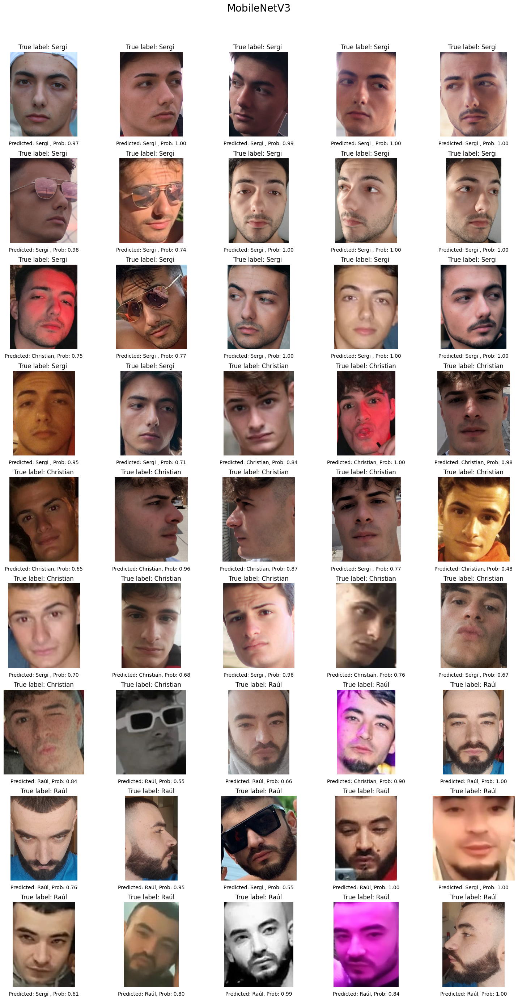

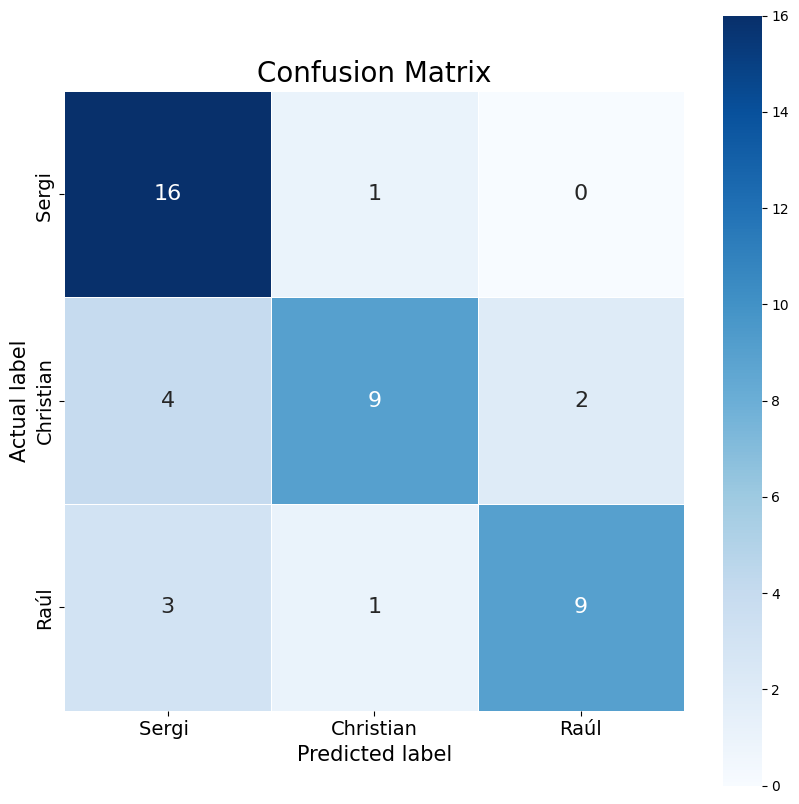

In [14]:
BASE_MODEL_TYPE = 'MobileNetV3'

model = load_model("cross_entropy_trained_models/" + "MobileNetV3.h5" )
preprocess_input = get_preprocess_function(BASE_MODEL_TYPE)
true_labels, predicted_labels, names = visualize(model, (224,224),preprocess_input, BASE_MODEL_TYPE)

In [16]:
report = classification_report(true_labels, predicted_labels, target_names=names, output_dict=True)
df = pd.DataFrame(report).transpose()

# Display as a styled table
df.style.set_table_styles(
    [{'selector': 'th',
    'props': [('background', '#606060'), 
                ('color', 'white'),
                ('font-family', 'verdana')]},
    {'selector': 'td',
    'props': [('font-family', 'verdana')]},
    ]
).set_precision(2)

df.style.background_gradient(cmap='viridis', subset=["precision", "recall", "f1-score"])

C:\Users\sergi\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:13: FutureWarning: this method is deprecated in favour of `Styler.format(precision=..)`
  del sys.path[0]


,precision,recall,f1-score,support
Sergi,0.695652,0.941176,0.800000,17.000000
Christian,0.818182,0.600000,0.692308,15.000000
Raúl,0.818182,0.692308,0.750000,13.000000
accuracy,0.755556,0.755556,0.755556,0.755556
macro avg,0.777339,0.744495,0.747436,45.000000
weighted avg,0.771893,0.755556,0.749658,45.000000
